In [1]:
import time
from pathlib import Path
from operator import itemgetter

import scanpy as sc
import numpy as np
import pandas as pd
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from scipy.sparse import csr_matrix
from joblib import Parallel, delayed
import os
import torch

import scSLAT
from scSLAT.model import Cal_Spatial_Net, load_anndatas, run_SLAT_mlp_AGF, spatial_match, run_SLAT, compute_lisi_for_adata, run_SLAT_AGF_contrast
from scSLAT.viz import match_3D_multi, hist, Sankey, build_3D
from scSLAT.metrics import region_statistics

In [3]:
spot_size_1 = 1
spot_size_2 = 10
pathology_color = [
    "#1F77B4", "#FF7F0E", "#2CA02C", "#D62728", "#9467BD", "#8C564B",
    "#E377C2", "#7F7F7F", "#BCBD22", "#17BECF", "#AEC7E8", "#FFBB78",
    "#98DF8A", "#FF9896", "#C5B0D5", "#C49C94", "#F7B6D2", "#C7C7C7",
    "#DBDB8D", "#9EDAE5", "#1F9B99", "#FFCD56", "#33A02C", "#FB9A99",
    "#A6CEE3"
]

In [4]:
# adata_1=sc.read_h5ad(r"D:\ppppaper\data\ATAC_stereo\Mouse_embryo_E10.5_E1S2_Stereo_seq.h5ad")
# adata_1.var_names_make_unique(join="++")
# adata_1

AnnData object with n_obs × n_vars = 4132 × 25544
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - Aire'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'annotation_colors'
    obsm: 'spatial'
    varm: 'PCs'

In [6]:
csv_data = pd.read_csv(r"D:\ppppaper\data\ATAC_stereo\Mouse_embryo_ME11_20um_ATAC_genescore.csv", header=0)
data = csv_data.T
gene_names = data.iloc[0, :]
data.columns = gene_names
data = data[1:]
barcodes = data.index
data.reset_index(inplace=True)
data.drop(columns=['index'], inplace=True)
data.set_index(barcodes, inplace=True)

In [4]:
data

Unnamed: 0,Hnf4g,Zfhx4,Pex2,UBC,1700008P02Rik,Pkia,Zc2hc1a,Il7,1700010I02Rik,Stmn2,...,Nanos1,Eif3a,Fam45a,Sfxn4,Prdx3,Grk5,Gm7102,Gm6020,Csf2ra,Gm21060
ATTGAGGAACGCTCGA,0,4,0,0,0,2,2,1,0,0,...,0,2,0,0,0,2,0,0,1,0
AAGACGGAAGAGTCAA,5,5,0,0,1,1,1,0,0,0,...,0,1,0,1,0,3,0,0,0,0
GAATCTGAATCCTGTA,1,2,0,0,0,0,2,0,0,1,...,0,0,0,0,0,1,0,0,1,0
CCGAAGTAGACTAGTA,1,3,0,0,0,0,0,1,0,1,...,0,1,0,0,0,7,0,0,0,0
CCGAAGTACCAGTTCA,2,3,0,0,0,0,3,0,0,0,...,0,0,0,2,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GAGCTGAAAAACATCG,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CGCATACACAGCGTTA,0,0,1,0,0,2,0,0,0,0,...,0,0,1,0,1,4,0,0,0,0
CTGTAGCCCCTCCTGA,0,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
AGTACAAGAGAGTCAA,0,0,0,0,0,1,1,1,0,0,...,0,0,0,0,1,1,0,0,0,0


In [2]:
adata_com = sc.read_h5ad(r"D:\ppppaper\data\ATAC_stereo\integrated_Mouse_embryo_RNA_ATAC_Seurat_lsi100_2024-02-07 15_07_46.293746.h5ad")
adata_com.var_names_make_unique(join="++")
adata_com

AnnData object with n_obs × n_vars = 6231 × 59024
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - Aire', 'batch_name_idx', 'barcode', 'suffix', 'x1', 'x2', 'p1', 'p2', 'Barcodes', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'Barcodes_cut', 'slice_name', 'batch_name', 'mclust', 'target_celltype'
    uns: 'annotation_colors', 'batch_name_colors', 'mclust_colors', 'neighbors', 'target_celltype_colors', 'umap'
    obsm: 'X_glue', 'X_seurat', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [3]:
adata_1 = adata_com[0:4132]
adata_com[0:4132].obs_names

Index(['301_191_RNA', '301_192_RNA', '301_193_RNA', '301_194_RNA',
       '301_195_RNA', '301_196_RNA', '301_197_RNA', '301_198_RNA',
       '301_199_RNA', '301_200_RNA',
       ...
       '386_191_RNA', '386_192_RNA', '387_192_RNA', '388_191_RNA',
       '388_192_RNA', '388_193_RNA', '389_191_RNA', '389_192_RNA',
       '389_259_RNA', '389_260_RNA'],
      dtype='object', length=4132)

In [9]:
adata_1

View of AnnData object with n_obs × n_vars = 4132 × 59024
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - Aire', 'batch_name_idx', 'barcode', 'suffix', 'x1', 'x2', 'p1', 'p2', 'Barcodes', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'Barcodes_cut', 'slice_name', 'batch_name', 'mclust', 'target_celltype'
    uns: 'annotation_colors', 'batch_name_colors', 'mclust_colors', 'neighbors', 'target_celltype_colors', 'umap'
    obsm: 'X_glue', 'X_seurat', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [4]:
adata_2 = adata_com[4132:6231]
adata_com[4132:6231].obs_names

Index(['0_ATAC', '1_ATAC', '2_ATAC', '3_ATAC', '4_ATAC', '5_ATAC', '6_ATAC',
       '7_ATAC', '8_ATAC', '9_ATAC',
       ...
       '2089_ATAC', '2090_ATAC', '2091_ATAC', '2092_ATAC', '2093_ATAC',
       '2094_ATAC', '2095_ATAC', '2096_ATAC', '2097_ATAC', '2098_ATAC'],
      dtype='object', length=2099)

In [5]:
adata_2

View of AnnData object with n_obs × n_vars = 2099 × 59024
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - Aire', 'batch_name_idx', 'barcode', 'suffix', 'x1', 'x2', 'p1', 'p2', 'Barcodes', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'Barcodes_cut', 'slice_name', 'batch_name', 'mclust', 'target_celltype'
    uns: 'annotation_colors', 'batch_name_colors', 'mclust_colors', 'neighbors', 'target_celltype_colors', 'umap'
    obsm: 'X_glue', 'X_seurat', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [10]:
gene_names

0                Hnf4g
1                Zfhx4
2                 Pex2
3                  UBC
4        1700008P02Rik
             ...      
21803             Grk5
21804           Gm7102
21805           Gm6020
21806           Csf2ra
21807          Gm21060
Name: Unnamed: 0, Length: 21808, dtype: object

In [12]:
gene_names_adata = adata_2.var_names

# 找出共同的基因
common_genes = list(set(gene_names) & set(gene_names_adata))

# 打印共同基因的数量
print('Number of overlap genes:', len(common_genes))

Number of overlap genes: 18339


In [13]:
data_filter = data[common_genes]
adata_2_filter = adata_2[:, common_genes]

In [14]:
adata_2_filter.X = data_filter

d:\Anaconda\envs\scSLAT\lib\site-packages\scipy\sparse\_sputils.py:114: UserWarning: object dtype is not supported by sparse matrices
  warnings.warn("object dtype is not supported by sparse matrices")
d:\Anaconda\envs\scSLAT\lib\site-packages\scipy\sparse\_index.py:137: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [14]:
# data_array = data.values
# data_array.shape

(2099, 21808)

In [ ]:
# data_array = data.values
# adata_2.obsm['genescore'] = data_array

In [14]:
x1_coords=adata_1.obsm['spatial'][:,0]
y1_coords=adata_1.obsm['spatial'][:,1]
x2_coords=adata_2_filter.obsm['spatial'][:,0]
y2_coords=adata_2_filter.obsm['spatial'][:,1]
locations_1 = np.array([x1_coords, y1_coords])
locations_2 = np.array([x2_coords, y2_coords])

locations_1_tensor = torch.tensor(locations_1)
locations_2_tensor = torch.tensor(locations_2)
locations_1_tensor = locations_1_tensor.transpose(0, 1)
locations_1_tensor = locations_1_tensor.to(dtype=torch.float32)
locations_2_tensor = locations_2_tensor.transpose(0, 1)
locations_2_tensor = locations_2_tensor.to(dtype=torch.float32)
location = [locations_1_tensor, locations_2_tensor]

In [15]:
Cal_Spatial_Net(adata_1, k_cutoff=10, model='KNN')
Cal_Spatial_Net(adata_2_filter, k_cutoff=10, model='KNN')

Calculating spatial neighbor graph ...
The graph contains 42976 edges, 4132 cells.
10.400774443368828 neighbors per cell on average.
Calculating spatial neighbor graph ...


D:\ppppaper\SLAT\SLAT-main\SLAT-main\scSLAT\model\preprocess.py:61: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['Spatial_Net'] = graph_df
D:\ppppaper\SLAT\SLAT-main\SLAT-main\scSLAT\model\preprocess.py:61: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['Spatial_Net'] = graph_df


The graph contains 22057 edges, 2099 cells.
10.508337303477846 neighbors per cell on average.


In [16]:
edges, features = load_anndatas([adata_1, adata_2_filter], feature='DPCA')

Use DPCA feature to format graph


d:\Anaconda\envs\scSLAT\lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [18]:
import scipy
import scipy.sparse

adatas = [adata_1, adata_2]
edgeLists = []
for adata in adatas:
    G_df = adata.uns['Spatial_Net'].copy()
    cells = np.array(adata.obs_names)
    cells_id_tran = dict(zip(cells, range(cells.shape[0])))
    G_df['Cell1'] = G_df['Cell1'].map(cells_id_tran)
    G_df['Cell2'] = G_df['Cell2'].map(cells_id_tran)

    # build adjacent matrix
    G = scipy.sparse.coo_matrix((np.ones(G_df.shape[0]), (G_df['Cell1'], G_df['Cell2'])), 
                                shape=(adata.n_obs, adata.n_obs))
    
    edgeList = np.nonzero(G)
    edgeList_tensor = torch.tensor(edgeList, dtype=torch.long)
    edgeLists.append(edgeList_tensor)
# edges = [dataset.edge_index for dataset in datas]

D:\tmpdir\Temp\ipykernel_30308\809586095.py:18: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:278.)
  edgeList_tensor = torch.tensor(edgeList, dtype=torch.long)


In [188]:
# adata_1_dense = adata_1.X.toarray()
# data1_tensor = torch.tensor(adata_1_dense, dtype=torch.float32)
# adata_2_dense = adata_2.X.toarray()
# data2_tensor = torch.tensor(adata_2_dense, dtype=torch.float32)

In [189]:
data1_tensor = torch.tensor(adata_1.obsm['X_glue'], dtype=torch.float32)
data2_tensor = torch.tensor(adata_2.obsm['X_glue'], dtype=torch.float32)

In [190]:
datas = [data1_tensor, data2_tensor]
datas

[tensor([[-1.7715e-03, -1.7231e-01,  1.5018e-02,  ...,  5.0522e-04,
           2.0447e-02, -1.7197e-02],
         [ 3.8445e-04,  2.6331e-01, -1.6783e-03,  ...,  1.4834e-02,
          -1.9742e-03,  1.2240e-02],
         [-3.7625e-02,  6.1324e-01,  4.5820e-03,  ..., -1.2748e-02,
           4.4678e-02, -6.6566e-02],
         ...,
         [ 1.3734e-03, -2.5544e-01,  2.7186e-03,  ...,  2.6616e-04,
          -3.7985e-03,  5.8578e-03],
         [ 6.9459e-03, -7.7884e-01, -6.9226e-03,  ...,  8.1170e-03,
          -1.4190e-02,  1.4812e-03],
         [-6.6755e-03, -5.1784e-01,  2.1709e-02,  ...,  9.3050e-04,
           3.1170e-02, -2.4984e-02]]),
 tensor([[-3.9671e-02, -1.1690e+00, -3.6433e-03,  ..., -3.7573e-04,
           1.0347e-02, -3.7120e-02],
         [ 1.5864e-03, -1.1501e+00, -8.0426e-03,  ..., -3.6654e-04,
          -1.7488e-03, -5.6502e-03],
         [ 9.7949e-03,  7.6825e-01, -1.4290e-02,  ...,  2.6758e-02,
           6.2990e-03, -1.0739e-02],
         ...,
         [-2.0901e-03,  1

In [191]:
edgeLists

[tensor([[   0,    0,    0,  ..., 4131, 4131, 4131],
         [   0,    1,    2,  ..., 4092, 4130, 4131]]),
 tensor([[   0,    0,    0,  ..., 2098, 2098, 2098],
         [   0,   39,  160,  ..., 1957, 1967, 2098]])]

In [192]:
# edges, features = load_anndatas([adata_1, adata_2], feature='glue')

In [193]:
edges = edgeLists
features = datas

In [194]:
features[0].shape

torch.Size([4132, 50])

In [61]:
embd0_0, embd0_1, embd1_0, embd1_1, embd0, embd1, time = run_SLAT_AGF_contrast(features, edges, location, limit_loss=0.0001)

GPU is not available
Running
---------- epochs: 1 ----------
---- Ran row_normalize in 0.03 s ----

---- Ran row_normalize in 0.00 s ----

---------- epochs: 2 ----------
---- Ran row_normalize in 0.03 s ----

---- Ran row_normalize in 0.00 s ----

---------- epochs: 3 ----------
---- Ran row_normalize in 0.01 s ----

---- Ran row_normalize in 0.01 s ----

---------- epochs: 4 ----------
---- Ran row_normalize in 0.02 s ----

---- Ran row_normalize in 0.00 s ----

---------- epochs: 5 ----------
---- Ran row_normalize in 0.03 s ----

---- Ran row_normalize in 0.01 s ----

---------- epochs: 6 ----------
---- Ran row_normalize in 0.02 s ----

---- Ran row_normalize in 0.02 s ----

---- Ran row_normalize in 0.03 s ----

---- Ran row_normalize in 0.02 s ----

---------- epochs: 1 ----------
---- Ran row_normalize in 0.03 s ----

---- Ran row_normalize in 0.00 s ----

---------- epochs: 2 ----------
---- Ran row_normalize in 0.02 s ----

---- Ran row_normalize in 0.02 s ----

---------- ep

In [62]:
adata_2_filter.obs['annotation'] = adata_2_filter.obs['Clusters']
adata_1.obsm['stLVG'] = embd0.detach().cpu().numpy()
adata_2_filter.obsm['stLVG'] = embd1.detach().cpu().numpy()
adata_embd_com = sc.concat([adata_1, adata_2_filter], label='slice_name', keys=['slice_1', 'slice_2'])

sc.pp.neighbors(adata_embd_com, use_rep= 'stLVG')
sc.tl.umap(adata_embd_com)

In [63]:
adata_embd_com

AnnData object with n_obs × n_vars = 6231 × 18339
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - Aire', 'batch_name_idx', 'barcode', 'suffix', 'x1', 'x2', 'p1', 'p2', 'Barcodes', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'Barcodes_cut', 'slice_name', 'batch_name', 'mclust', 'target_celltype'
    uns: 'neighbors', 'umap'
    obsm: 'X_glue', 'X_seurat', 'X_umap', 'spatial', 'stLVG'
    obsp: 'distances', 'connectivities'

d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


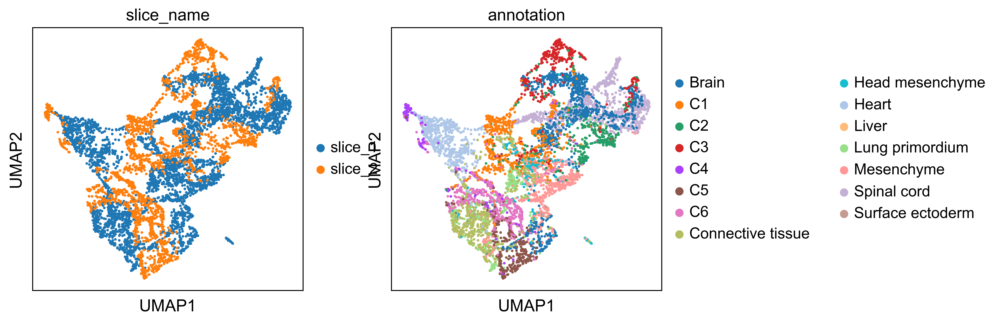

In [64]:
sc.pl.umap(adata_embd_com, color= ['slice_name', 'annotation'])

In [65]:
best, index, distance = spatial_match([embd0, embd1], adatas=[adata_1, adata_2_filter])
adata1_df = pd.DataFrame({'index': range(embd0.shape[0]),
                        'x': adata_1.obsm['spatial'][:,0],
                        'y': adata_1.obsm['spatial'][:,1],
                        'celltype': adata_1.obs['annotation']})
adata2_df = pd.DataFrame({'index': range(embd1.shape[0]),
                        'x': adata_2_filter.obsm['spatial'][:,0],
                        'y': adata_2_filter.obsm['spatial'][:,1],
                        'celltype': adata_2_filter.obs['annotation']})

matching = np.array([range(index.shape[0]), best])
best_match = distance[:,0]

0.400~0.450         0          0.000%
0.450~0.500         0          0.000%
0.500~0.550         1          0.048%
0.550~0.600         0          0.000%
0.600~0.650         0          0.000%
0.650~0.700         2          0.095%
0.700~0.750        25          1.191%
0.750~0.800        98          4.669%
0.800~0.850       169          8.051%
0.850~0.900       367         17.485%
0.900~0.950       773         36.827%
0.950~1.000       664         31.634%


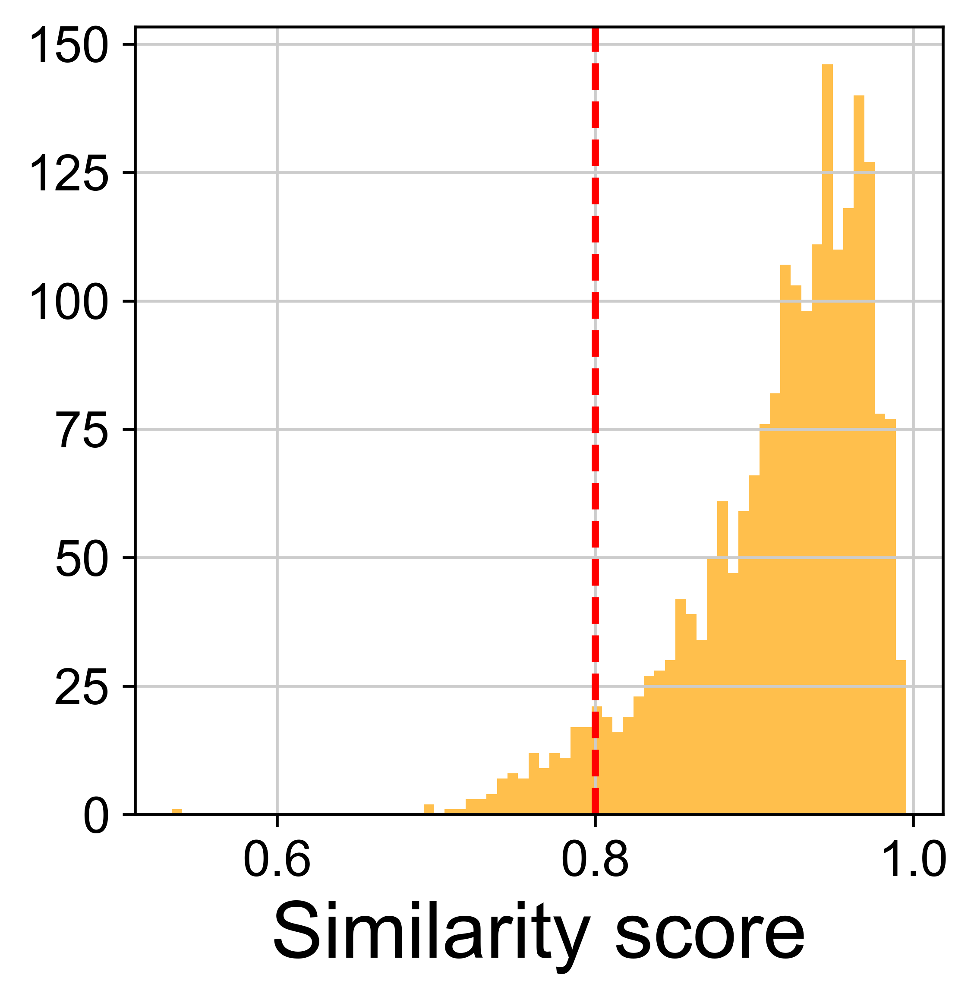

In [66]:
import matplotlib.pyplot as plt
region_statistics(best_match, start=0.4, number_of_interval=12)
# plt.rcParams['xtick.labelsize'] = 14
# plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['font.size'] = 18
cut = 0.8
plt.hist(best_match, bins=70, alpha=0.7, color='orange')  # bins可以根据需要调整，alpha设置透明度以便看到线
plt.axvline(x=cut, color='r', linestyle='--', linewidth=2)


plt.xlabel('Similarity score', fontsize=22)
plt.ylabel('', fontsize=14)
plt.title('', fontsize=20)
plt.show()

In [67]:
adata2_df['target_celltype'] = adata1_df.iloc[matching[1,:],:]['celltype'].to_list()
matching_table = adata2_df.groupby(['celltype','target_celltype']).size().unstack(fill_value=0)

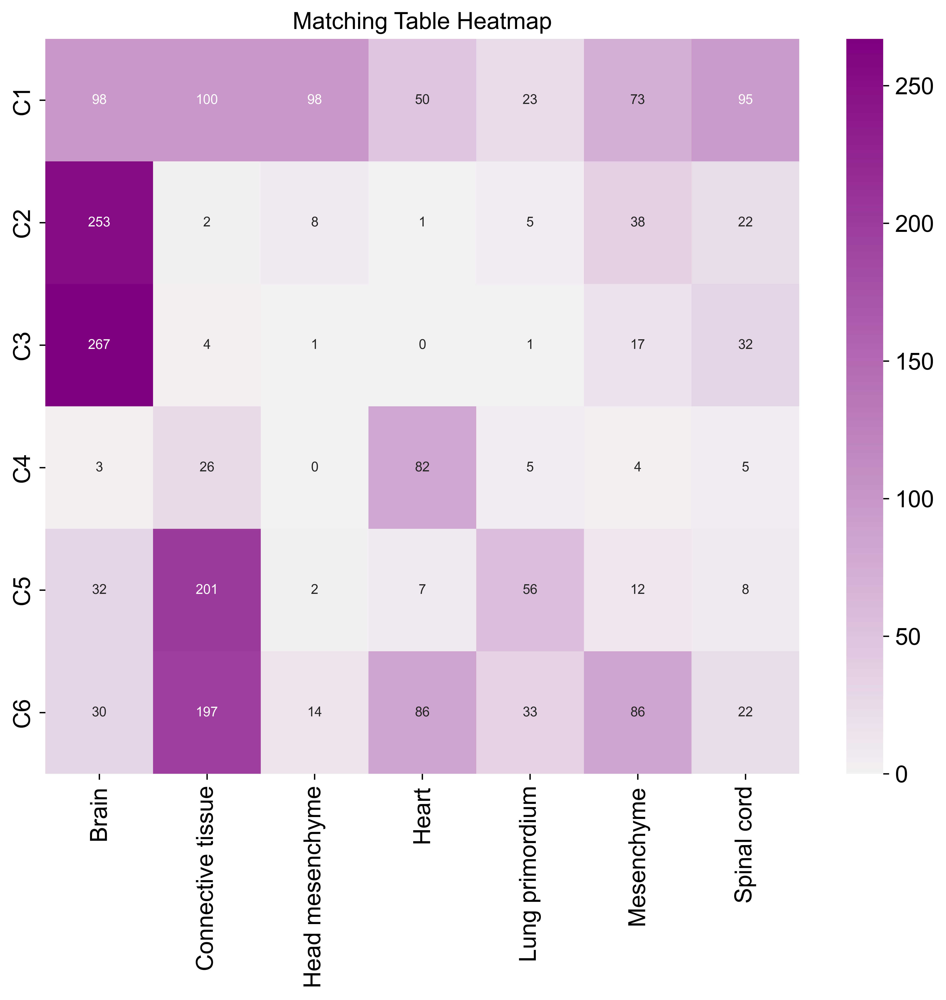

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt


sc.set_figure_params(dpi=300, dpi_save=300, transparent=True, facecolor=(1,1,1,1))
custom_cmap = sns.color_palette("light:purple", as_cmap=True)

plt.figure(figsize=(10, 8))  
sns.heatmap(matching_table, annot=True, fmt="d", cmap=custom_cmap, annot_kws={'fontsize': 8})  

plt.title('Matching Table Heatmap')
plt.xlabel('')
plt.ylabel('')
plt.show()

dataset1: 9 cell types; dataset2: 6 cell types; 
                    Total :15 celltypes; Overlap: 0 cell types 
                    Not overlap :[['Connective tissue', 'Heart', 'Lung primordium', 'Brain', 'Mesenchyme', 'Liver', 'Spinal cord', 'Head mesenchyme', 'Surface ectoderm', 'C5', 'C6', 'C3', 'C2', 'C4', 'C1']]
Subsampled 300 pairs from 2099


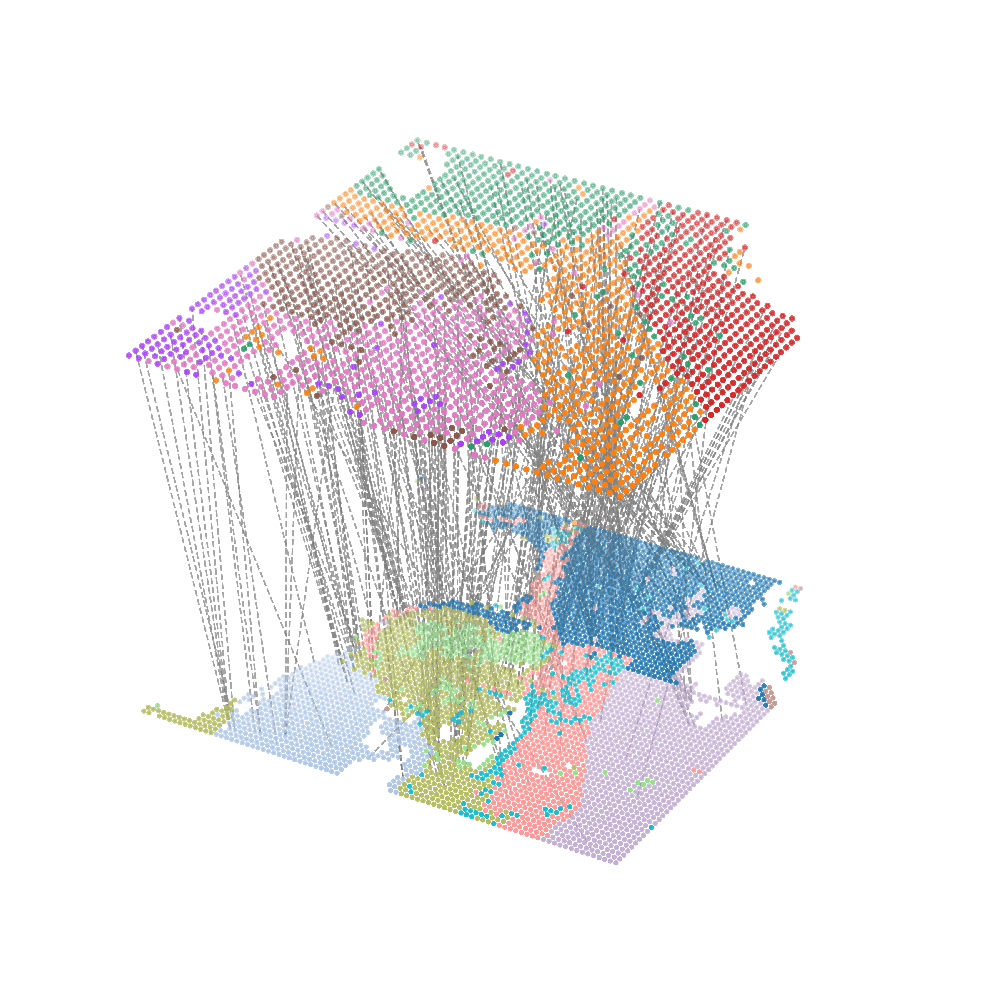

In [69]:
multi_align = match_3D_multi(adata1_df, adata2_df, matching, meta='celltype', rotate=['y','y'],
                             scale_coordinate=True, subsample_size=300, exchange_xy=False)

multi_align.draw_3D(size=[7, 8], line_width=0.7, line_color='grey', point_size=[1.25,2.5], 
                    hide_axis=True, show_error=False)

In [70]:
first_indices = matching[0]
second_indices = matching[1]
second_array_labels = adata1_df.iloc[second_indices]['celltype'].values

max_index = first_indices.max()
new_labels = np.empty(max_index + 1, dtype=object)

# transfer
new_labels[first_indices] = second_array_labels

adata_2_filter.obs['transferred_labels'] = new_labels

[<AxesSubplot: xlabel='spatial1', ylabel='spatial2'>]

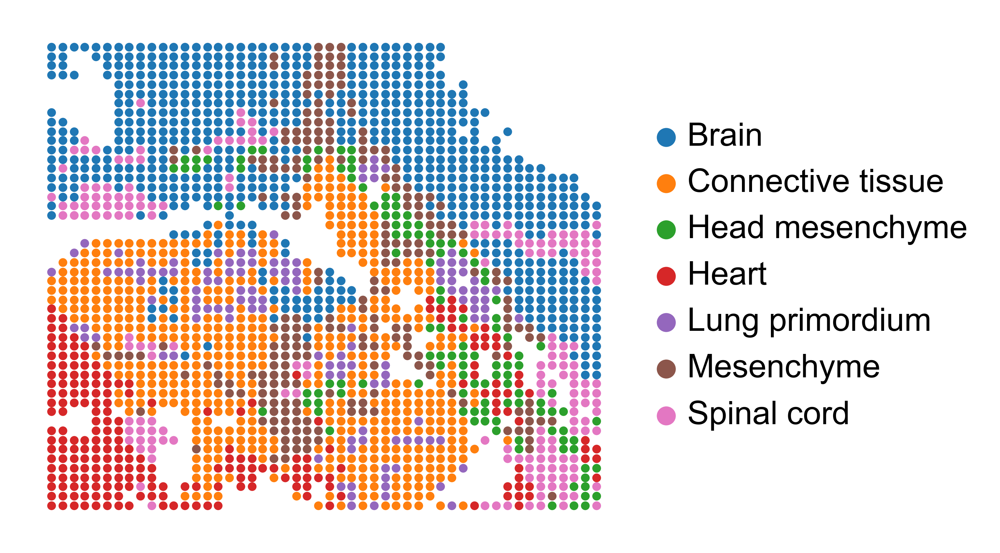

In [71]:
sc.pl.spatial(adata_2_filter, img_key=None, color=['transferred_labels'], title=[''],
                legend_fontsize=12, show=False, frameon=False, palette=pathology_color,
                spot_size=spot_size_2)

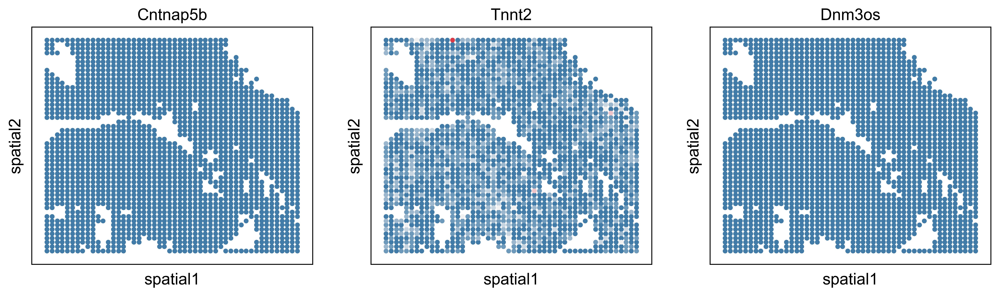

In [81]:
import seaborn as sns
# cmap = sns.light_palette("red", n_colors=4, as_cmap=True)
cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)

sc.pl.spatial(adata_2, spot_size=12, color=['Cntnap5b', 'Tnnt2', 'Dnm3os'], color_map=cmap, colorbar_loc=None)

In [ ]:
# adata_2_filter.write('D:\ppppaper\data\Result\ATAC_stereo.h5ad')

In [2]:
atac_score = pd.read_csv(r"D:\WeChat\WeChat Files\wxid_blfvg4sns2ju22\FileStorage\File\2025-02\ArchR_impute_score.csv", index_col=0).T

atac_score['barcodes'] = atac_score.index.str.split('-').str[0].str.split('#').str[1]
atac = sc.read_h5ad(r"D:\ppppaper\data\ATAC_stereo\Mouse_embryo_ME11_20um_ATAC_seq.h5ad")
atac.obs['barcodes'] = atac.obs['Barcodes'].str.split('-').str[0].str.split('#').str[1]
merged_df = pd.merge(atac.obs, atac_score, on = 'barcodes', suffixes = ('_left', '_right'))
merged_df.index = merged_df.barcode
atac.obs = merged_df

In [3]:
atac_score

,Xkr4,Rp1,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,...,Frmpd4,Msl3,Arhgap6,Amelx,Hccs,Gm15246,Mid1,4933400A11Rik,Asmt,barcodes
ME11_20um#AACGTGATCGCTGATC-1,1.335770,0.459758,0.501199,0.320849,0.226381,0.247574,0.490710,0.369180,0.395015,0.587113,...,1.738542,0.254661,0.822186,0.156684,0.194438,0.202441,0.572487,0.236538,0.0,AACGTGATCGCTGATC
ME11_20um#CGCTGATCAGAGTCAA-1,1.415500,0.485393,0.506850,0.328476,0.231897,0.245467,0.512678,0.385234,0.416128,0.626477,...,1.808302,0.257677,0.845674,0.165235,0.197359,0.207579,0.571778,0.235442,0.0,CGCTGATCAGAGTCAA
ME11_20um#AACGTGATCATCAAGT-1,1.204811,0.408039,0.492372,0.309801,0.218659,0.247610,0.458082,0.335159,0.355019,0.508418,...,1.575282,0.251858,0.747777,0.128527,0.187118,0.190380,0.554040,0.231205,0.0,AACGTGATCATCAAGT
ME11_20um#CGACTGGACTGAGCCA-1,1.795597,0.625176,0.551411,0.361170,0.262493,0.242528,0.612938,0.474520,0.511289,0.826988,...,2.232833,0.259631,0.973852,0.200289,0.201583,0.234222,0.592189,0.238153,0.0,CGACTGGACTGAGCCA
ME11_20um#CGCTGATCACGTATCA-1,1.120995,0.382522,0.482392,0.302762,0.212518,0.250066,0.440115,0.319429,0.333905,0.466931,...,1.465579,0.251750,0.699875,0.112596,0.182622,0.183823,0.538878,0.228395,0.0,CGCTGATCACGTATCA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ME11_20um#CACTTCGAGAGCTGAA-1,1.093862,0.377962,0.462577,0.296704,0.211584,0.251245,0.449846,0.324495,0.342138,0.440111,...,1.384926,0.250356,0.645021,0.096664,0.177459,0.190789,0.536485,0.245212,0.0,CACTTCGAGAGCTGAA
ME11_20um#GATAGACACATACCAA-1,1.161474,0.375705,0.460314,0.299505,0.224895,0.250755,0.464335,0.332210,0.339216,0.464621,...,1.387304,0.245708,0.662568,0.105067,0.187425,0.191991,0.539465,0.245267,0.0,GATAGACACATACCAA
ME11_20um#AACGCTTAGAGCTGAA-1,0.888206,0.270590,0.440362,0.290296,0.196578,0.267496,0.427886,0.301123,0.282012,0.434603,...,1.171332,0.248977,0.530462,0.066936,0.149108,0.145326,0.565373,0.256419,0.0,AACGCTTAGAGCTGAA
ME11_20um#CAGCGTTACTCAATGA-1,1.130862,0.356547,0.466991,0.297098,0.222191,0.247601,0.464174,0.343780,0.318786,0.454942,...,1.361524,0.249118,0.623693,0.095274,0.174519,0.180101,0.542051,0.242028,0.0,CAGCGTTACTCAATGA


In [17]:
adata_2

AnnData object with n_obs × n_vars = 2099 × 59024
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - Aire', 'batch_name_idx', 'barcode', 'suffix', 'x1', 'x2', 'p1', 'p2', 'Barcodes', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'Barcodes_cut', 'slice_name', 'batch_name', 'mclust', 'target_celltype', 'Xkr4', 'Rp1', 'Sox17', 'Mrpl15', 'Lypla1', 'Tcea1', 'Rgs20', 'Atp6v1h', 'Oprk1', 'Npbwr1', 'Rb1cc1', 'Alkal1', 'St18', 'Pcmtd1', 'Sntg1', 'Rrs1', 'Adhfe1', '2610203C22Rik', 'Vxn', 'Mybl1', 'Vcpip1', '1700034P13Rik', 'Sgk3', 'Mcmdc2', 'Snhg6', 'Snord87', 'Tcf24', 'Ppp1r42', 'Cops5', 'Cspp1', 'Arfgef1', 'Cpa6', 'Prex2', 'A830018L16Rik', 'Mir6341', 'Gm17644', 'Sulf1', 'Slco5a1', 'Prdm14', 'Ncoa2', 'Tram1', 'Lactb2', 'Xkr9', 'Gm5523', 'Eya1', 'Msc', 'Trpa1', 'Kcnb2',

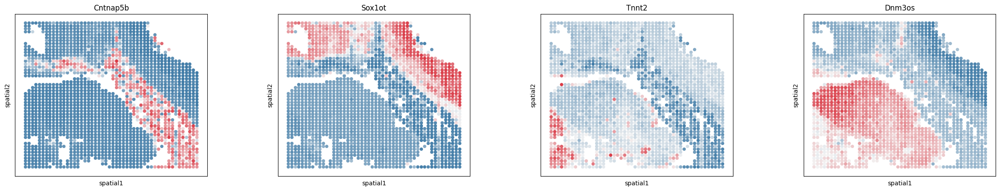

In [4]:
import seaborn as sns
# cmap = sns.light_palette("red", n_colors=4, as_cmap=True)
cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)

sc.pl.spatial(atac, spot_size=12, color=['Cntnap5b', 'Sox1ot', 'Tnnt2', 'Dnm3os'], color_map=cmap, colorbar_loc=None)

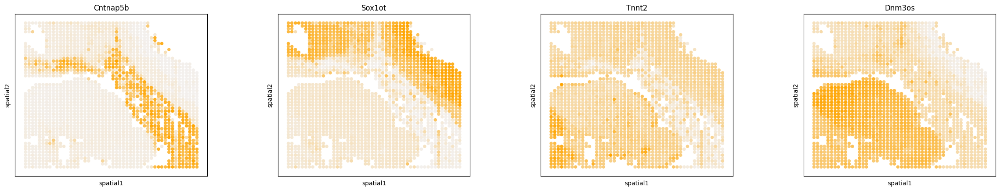

In [15]:
import seaborn as sns
cmap = sns.light_palette("orange", n_colors=200, as_cmap=True)

sc.pl.spatial(atac, spot_size=12, color=['Cntnap5b', 'Sox1ot', 'Tnnt2', 'Dnm3os'], color_map=cmap, colorbar_loc=None)